# Analysis of time stamps in Autoformer

In [1]:
import sys

sys.path.append("..")
sys.path.append("../..")
import activations_interpretations.data_utils as data_utils
import analysis.activations_interpretations.CKA as CKA
import analysis.activations_interpretations.activations as activations_file

%matplotlib inline

In [2]:
from torch.utils.data import Dataset
from sklearn.preprocessing import StandardScaler

import pandas as pd
import os
from utils.timefeatures import time_features

In [3]:
root_path = "/Users/angelavansprang/Documents/PhD/transformers for time series/Interpreting Time Series Transformers/dataset/electricity/"
data_path = "electricity.csv"

df_raw = pd.read_csv(os.path.join(root_path, data_path))

In [4]:
df_raw["date"]

0        2016-07-01 02:00:00
1        2016-07-01 03:00:00
2        2016-07-01 04:00:00
3        2016-07-01 05:00:00
4        2016-07-01 06:00:00
                ...         
26299    2019-07-01 21:00:00
26300    2019-07-01 22:00:00
26301    2019-07-01 23:00:00
26302    2019-07-02 00:00:00
26303    2019-07-02 01:00:00
Name: date, Length: 26304, dtype: object

## 0. Set-up

In [5]:
from typing import List

from pandas.tseries.frequencies import to_offset
from pandas.tseries import offsets
import numpy as np


class TimeFeature:
    def __init__(self):
        pass

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        pass

    def __repr__(self):
        return self.__class__.__name__ + "()"


class SecondOfMinute(TimeFeature):
    """Minute of hour encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        return index.second / 59.0 - 0.5


class MinuteOfHour(TimeFeature):
    """Minute of hour encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        return index.minute / 59.0 - 0.5


class HourOfDay(TimeFeature):
    """Hour of day encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex, offset=0) -> np.ndarray:
        return (index.hour + offset) % 24 / 23.0 - 0.5

    def inverse(input: np.ndarray) -> np.ndarray:
        return (input + 0.5) * 23.0


class DayOfWeek(TimeFeature):
    """Hour of day encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex, offset=0) -> np.ndarray:
        return (index.dayofweek + offset) % 7 / 6.0 - 0.5

    def inverse(input: np.ndarray) -> np.ndarray:
        return (input + 0.5) * 6.0


class DayOfMonth(TimeFeature):
    """Day of month encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex, offset=0) -> np.ndarray:
        return (index.day - 1 + offset) % 31 / 30.0 - 0.5

    def inverse(input: np.ndarray) -> np.ndarray:
        return (input + 0.5) * 30.0 + 1


class DayOfYear(TimeFeature):
    """Day of year encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex, offset=0) -> np.ndarray:
        return (index.dayofyear - 1 + offset) % 366 / 365.0 - 0.5

    def inverse(input: np.ndarray) -> np.ndarray:
        return (input + 0.5) * 365.0 + 1


class MonthOfYear(TimeFeature):
    """Month of year encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        return (index.month - 1) / 11.0 - 0.5


class WeekOfYear(TimeFeature):
    """Week of year encoded as value between [-0.5, 0.5]"""

    def __call__(self, index: pd.DatetimeIndex) -> np.ndarray:
        return (index.isocalendar().week - 1) / 52.0 - 0.5


def time_features_from_frequency_str(freq_str: str) -> List[TimeFeature]:
    """
    Returns a list of time features that will be appropriate for the given frequency string.
    Parameters
    ----------
    freq_str
        Frequency string of the form [multiple][granularity] such as "12H", "5min", "1D" etc.
    """

    features_by_offsets = {
        offsets.YearEnd: [],
        offsets.QuarterEnd: [MonthOfYear],
        offsets.MonthEnd: [MonthOfYear],
        offsets.Week: [DayOfMonth, WeekOfYear],
        offsets.Day: [DayOfWeek, DayOfMonth, DayOfYear],
        offsets.BusinessDay: [DayOfWeek, DayOfMonth, DayOfYear],
        offsets.Hour: [HourOfDay, DayOfWeek, DayOfMonth, DayOfYear],
        offsets.Minute: [
            MinuteOfHour,
            HourOfDay,
            DayOfWeek,
            DayOfMonth,
            DayOfYear,
        ],
        offsets.Second: [
            SecondOfMinute,
            MinuteOfHour,
            HourOfDay,
            DayOfWeek,
            DayOfMonth,
            DayOfYear,
        ],
    }

    offset = to_offset(freq_str)

    for offset_type, feature_classes in features_by_offsets.items():
        if isinstance(offset, offset_type):
            return [cls() for cls in feature_classes]

    supported_freq_msg = f"""
    Unsupported frequency {freq_str}
    The following frequencies are supported:
        Y   - yearly
            alias: A
        M   - monthly
        W   - weekly
        D   - daily
        B   - business days
        H   - hourly
        T   - minutely
            alias: min
        S   - secondly
    """
    raise RuntimeError(supported_freq_msg)


def time_features(
    dates,
    freq="h",
    HourOfDay_offset=0,
    DayOfWeek_offset=0,
    DayOfMonth_offset=0,
    DayOfYear_offset=0,
):
    func = [HourOfDay(), DayOfWeek(), DayOfMonth(), DayOfYear()]
    output = []
    for feat in func:
        if isinstance(feat, HourOfDay):
            output.append(feat(dates, HourOfDay_offset))
        elif isinstance(feat, DayOfWeek):
            output.append(feat(dates, DayOfWeek_offset))
        elif isinstance(feat, DayOfMonth):
            output.append(feat(dates, DayOfMonth_offset))
        elif isinstance(feat, DayOfYear):
            output.append(feat(dates, DayOfYear_offset))

    return np.vstack(output)

In [6]:
birthday = pd.to_datetime("2000-03-06 12:00:00")
func = [HourOfDay(), DayOfWeek(), DayOfMonth(), DayOfYear()]
for f in func:
    print(f(birthday))
    print(f(birthday, offset=0))

0.021739130434782594
0.021739130434782594
-0.5
-0.5
-0.33333333333333337
-0.33333333333333337
-0.3219178082191781
-0.3219178082191781


In [7]:
time_features(pd.to_datetime(df_raw["date"].values), HourOfDay_offset=12)

# df_stamp = df_raw[["date"]]
# df_stamp["date"] = pd.to_datetime(df_stamp.date)
# data_stamp = time_features(
#     pd.to_datetime(df_stamp["date"].values), freq='h'
# )
# data_stamp = data_stamp.transpose(1, 0)

array([[ 0.10869565,  0.15217391,  0.19565217, ..., -0.02173913,
         0.02173913,  0.06521739],
       [ 0.16666667,  0.16666667,  0.16666667, ..., -0.5       ,
        -0.33333333, -0.33333333],
       [-0.5       , -0.5       , -0.5       , ..., -0.5       ,
        -0.46666667, -0.46666667],
       [-0.00136986, -0.00136986, -0.00136986, ..., -0.00410959,
        -0.00136986, -0.00136986]])

In [8]:
class Dataset_Custom_delay(Dataset):
    def __init__(
        self,
        root_path,
        flag="train",
        size=None,
        features="S",
        data_path="ETTh1.csv",
        target="OT",
        scale=True,
        timeenc=0,
        freq="h",
        HourOfDay_offset=0,
        DayOfWeek_offset=0,
        DayOfMonth_offset=0,
        DayOfYear_offset=0,
    ):
        # size [seq_len, label_len, pred_len]
        # info
        if size == None:
            self.seq_len = 24 * 4 * 4
            self.label_len = 24 * 4
            self.pred_len = 24 * 4
        else:
            self.seq_len = size[0]
            self.label_len = size[1]
            self.pred_len = size[2]
        # init
        assert flag in ["train", "test", "val"]
        type_map = {"train": 0, "val": 1, "test": 2}
        self.set_type = type_map[flag]

        self.features = features
        self.target = target
        self.scale = scale
        self.timeenc = timeenc
        self.freq = freq

        self.HourOfDay_offset = HourOfDay_offset
        self.DayOfWeek_offset = DayOfWeek_offset
        self.DayOfMonth_offset = DayOfMonth_offset
        self.DayOfYear_offset = DayOfYear_offset

        self.root_path = root_path
        self.data_path = data_path
        self.__read_data__()

    def __read_data__(self):
        self.scaler = StandardScaler()
        df_raw = pd.read_csv(os.path.join(self.root_path, self.data_path))

        """
        df_raw.columns: ['date', ...(other features), target feature]
        """
        cols = list(df_raw.columns)
        cols.remove(self.target)
        cols.remove("date")
        df_raw = df_raw[["date"] + cols + [self.target]]
        # print(cols)
        num_train = int(len(df_raw) * 0.7)
        num_test = int(len(df_raw) * 0.2)
        num_vali = len(df_raw) - num_train - num_test
        border1s = [0, num_train - self.seq_len, len(df_raw) - num_test - self.seq_len]
        border2s = [num_train, num_train + num_vali, len(df_raw)]
        border1 = border1s[self.set_type]
        border2 = border2s[self.set_type]

        if self.features == "M" or self.features == "MS":
            cols_data = df_raw.columns[1:]
            df_data = df_raw[cols_data]
        elif self.features == "S":
            df_data = df_raw[[self.target]]

        if self.scale:
            train_data = df_data[border1s[0] : border2s[0]]
            self.scaler.fit(train_data.values)
            data = self.scaler.transform(df_data.values)
        else:
            data = df_data.values

        df_stamp = df_raw[["date"]][border1:border2]
        df_stamp["date"] = pd.to_datetime(df_stamp.date)
        if self.timeenc == 0:
            df_stamp["month"] = df_stamp.date.apply(lambda row: row.month, 1)
            df_stamp["day"] = df_stamp.date.apply(lambda row: row.day, 1)
            df_stamp["weekday"] = df_stamp.date.apply(lambda row: row.weekday(), 1)
            df_stamp["hour"] = df_stamp.date.apply(lambda row: row.hour, 1)
            data_stamp = df_stamp.drop(["date"], 1).values
        elif self.timeenc == 1:
            data_stamp = time_features(
                pd.to_datetime(df_stamp["date"].values),
                freq=self.freq,
                HourOfDay_offset=self.HourOfDay_offset,
                DayOfWeek_offset=self.DayOfWeek_offset,
                DayOfMonth_offset=self.DayOfMonth_offset,
                DayOfYear_offset=self.DayOfYear_offset,
            )
            data_stamp = data_stamp.transpose(1, 0)

        self.data_x = data[border1:border2]
        self.data_y = data[border1:border2]
        self.data_stamp = data_stamp

    def __getitem__(self, index):
        s_begin = index
        s_end = s_begin + self.seq_len
        r_begin = s_end - self.label_len
        r_end = r_begin + self.label_len + self.pred_len

        seq_x = self.data_x[s_begin:s_end]
        seq_y = self.data_y[r_begin:r_end]
        seq_x_mark = self.data_stamp[s_begin:s_end]
        seq_y_mark = self.data_stamp[r_begin:r_end]

        return seq_x, seq_y, seq_x_mark, seq_y_mark

    def __len__(self):
        return len(self.data_x) - self.seq_len - self.pred_len + 1

    def inverse_transform(self, data):
        return self.scaler.inverse_transform(data)

In [9]:
from torch.utils.data import DataLoader


def obtain_data_loader(
    pred_len,
    dataset,
    seq_len=96,
    split="train",
    HourOfDay_offset=0,
    DayOfWeek_offset=0,
    DayOfMonth_offset=0,
    DayOfYear_offset=0,
):
    label_len = 48

    if dataset == "ECL" or dataset == "electricity":
        datafolder = "electricity"
        features = "M"
    else:
        datafolder = "generated"
        features = "S"

    dataset = Dataset_Custom_delay(
        root_path=f"/Users/angelavansprang/Documents/PhD/transformers for time series/Interpreting Time Series Transformers/dataset/{datafolder}/",
        data_path=f"{dataset}.csv",
        flag=split,  # flag must be train in order for the linear dataloader to contain the same data
        size=[seq_len, label_len, pred_len],  # seq_len, label_len, pred_len
        features=features,
        target="OT",  # default
        timeenc=1,
        freq="h",
        HourOfDay_offset=HourOfDay_offset,
        DayOfWeek_offset=DayOfWeek_offset,
        DayOfMonth_offset=DayOfMonth_offset,
        DayOfYear_offset=DayOfYear_offset,
    )

    dataloader = DataLoader(
        dataset,
        batch_size=1,
        shuffle=False,
        num_workers=0,
        drop_last=False,
    )
    return dataloader

## 1. Delay Time stamps

In [10]:
data_loader = obtain_data_loader(
    pred_len=96, dataset="electricity", split="test", HourOfDay_offset=0
)
data_loader_12h = obtain_data_loader(
    pred_len=96, dataset="electricity", split="test", HourOfDay_offset=12
)

In [11]:
autoformer = data_utils.obtain_autoformer(pred_len=96, dataset="ECL")

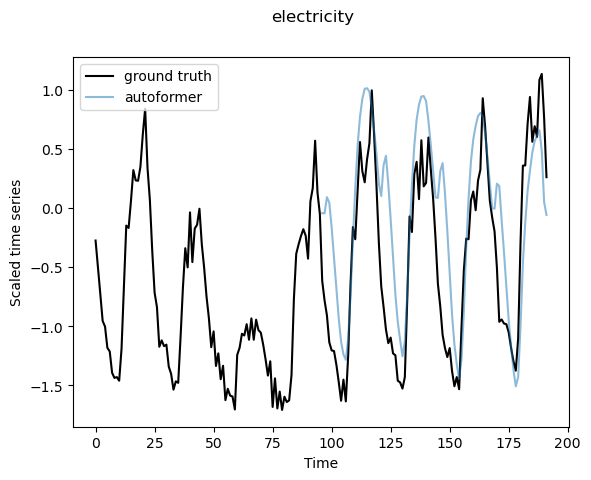

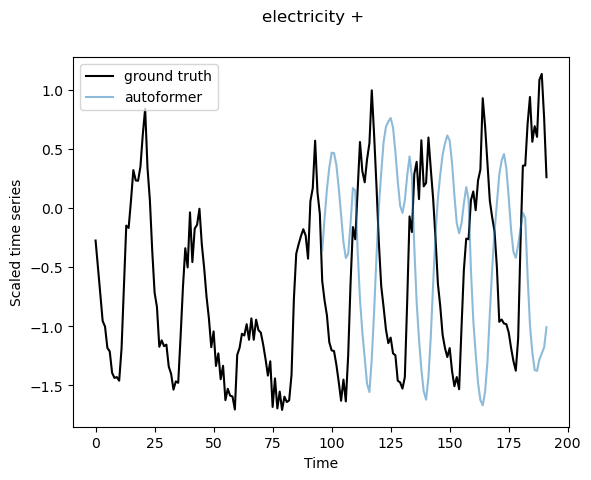

In [12]:
data_utils.obtain_plot_predictions(
    pred_len=96,
    data_set="electricity",
    data_loader=data_loader,
    model=autoformer,
)

data_utils.obtain_plot_predictions(
    pred_len=96,
    data_set="electricity +12h",
    data_loader=data_loader_12h,
    model=autoformer,
)

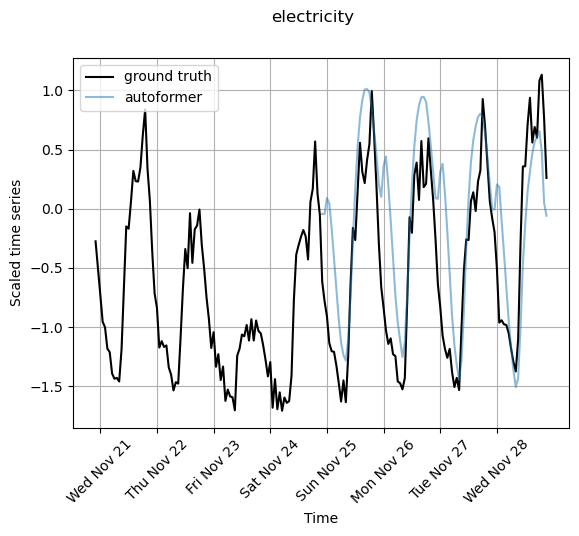

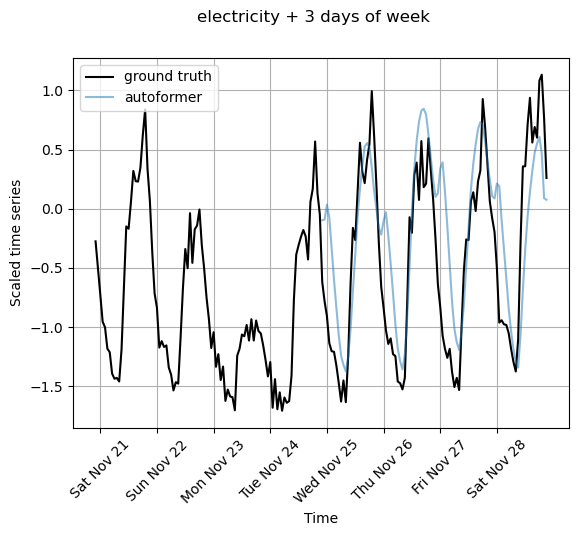

In [13]:
data_loader_3dow = obtain_data_loader(
    pred_len=96, dataset="electricity", split="test", DayOfWeek_offset=3
)

data_utils.obtain_plot_predictions(
    pred_len=96,
    data_set="electricity",
    data_loader=data_loader,
    model=autoformer,
    timestamps=True,
)

data_utils.obtain_plot_predictions(
    pred_len=96,
    data_set="electricity + 3 days of week",
    data_loader=data_loader_3dow,
    model=autoformer,
    timestamps=True,
)

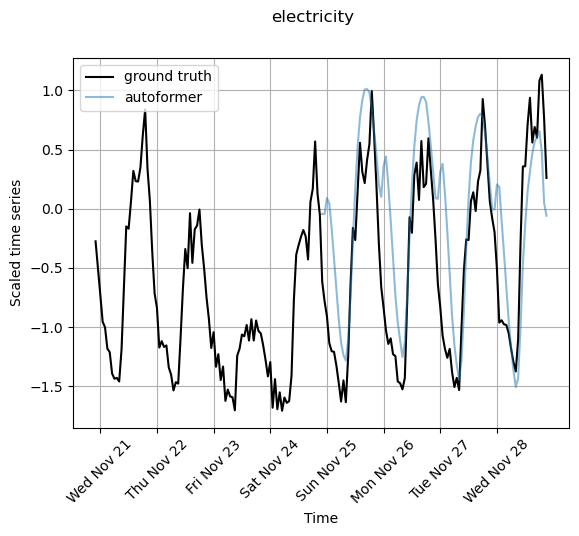

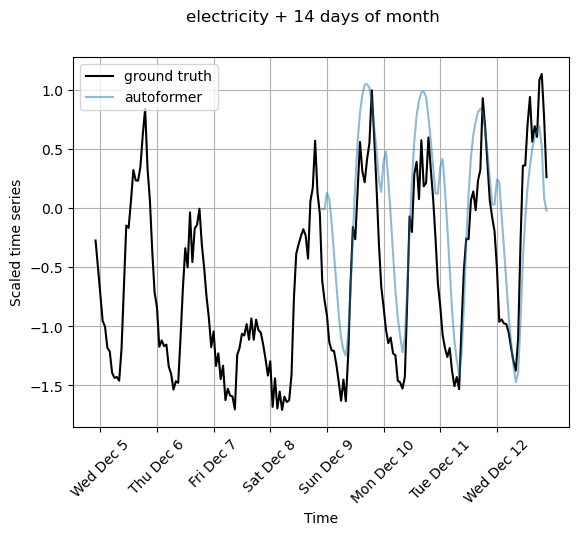

In [43]:
data_loader_3dow = obtain_data_loader(
    pred_len=96,
    dataset="electricity",
    split="test",
    DayOfMonth_offset=14,
    DayOfYear_offset=14,
)

data_utils.obtain_plot_predictions(
    pred_len=96,
    data_set="electricity",
    data_loader=data_loader,
    model=autoformer,
    timestamps=True,
)

data_utils.obtain_plot_predictions(
    pred_len=96,
    data_set="electricity + 14 days of month",
    data_loader=data_loader_3dow,
    model=autoformer,
    timestamps=True,
)

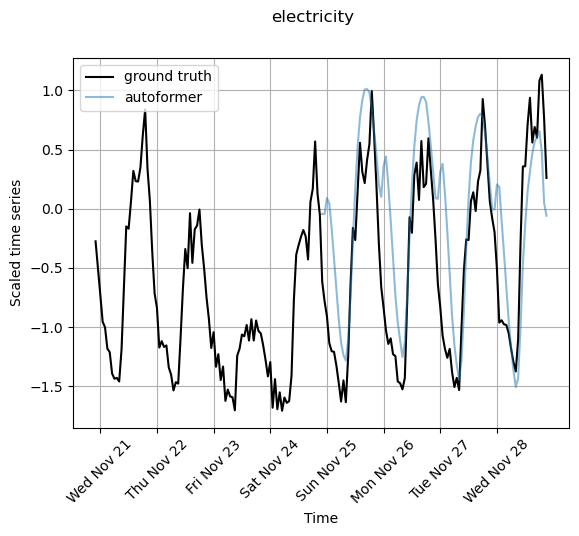

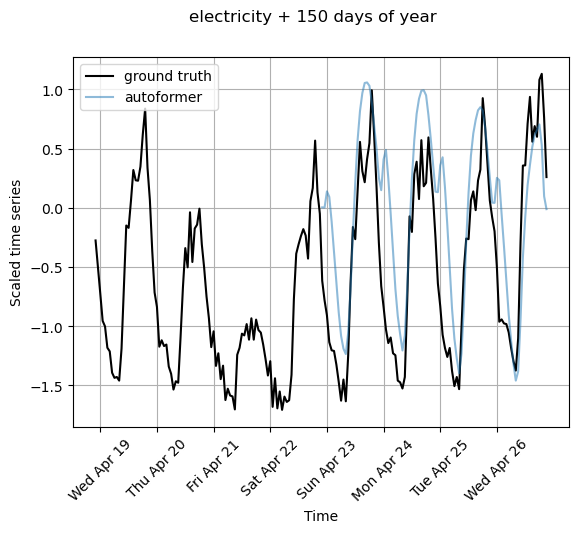

In [15]:
data_loader_150doy = obtain_data_loader(
    pred_len=96, dataset="electricity", split="test", DayOfYear_offset=150
)

data_utils.obtain_plot_predictions(
    pred_len=96,
    data_set="electricity",
    data_loader=data_loader,
    model=autoformer,
    timestamps=True,
)

data_utils.obtain_plot_predictions(
    pred_len=96,
    data_set="electricity + 150 days of year",
    data_loader=data_loader_150doy,
    model=autoformer,
    timestamps=True,
)

In [16]:
import numpy as np

path = "../results/"
name_12hod = "seed42_ECL_96_96_Autoformer_custom_12hod_0dow_0dom_0doy_ftM_sl96_ll48_pl96_dm512_nh8_el8_dl1_df2048_fc3_ebtimeF_dtTrue_Exp_0/metrics.npy"

metrics_12hod = np.load(path + name_12hod, allow_pickle=True)
metrics_12hod = metrics_12hod.item()

name_3dow = "seed42_ECL_96_96_Autoformer_custom_0hod_3dow_0dom_0doy_ftM_sl96_ll48_pl96_dm512_nh8_el8_dl1_df2048_fc3_ebtimeF_dtTrue_Exp_0/metrics.npy"

metrics_3dow = np.load(path + name_3dow, allow_pickle=True)
metrics_3dow = metrics_3dow.item()

name_15dom = "seed42_ECL_96_96_Autoformer_custom_0hod_0dow_15dom_0doy_ftM_sl96_ll48_pl96_dm512_nh8_el8_dl1_df2048_fc3_ebtimeF_dtTrue_Exp_0/metrics.npy"

metrics_15dom = np.load(path + name_15dom, allow_pickle=True)
metrics_15dom = metrics_15dom.item()

name_180doy = "seed42_ECL_96_96_Autoformer_custom_0hod_0dow_0dom_180doy_ftM_sl96_ll48_pl96_dm512_nh8_el8_dl1_df2048_fc3_ebtimeF_dtTrue_Exp_0/metrics.npy"

metrics_180doy = np.load(path + name_180doy, allow_pickle=True)
metrics_180doy = metrics_180doy.item()

In [17]:
path = "../results/"
name = "seed42_ECL_96_96_Autoformer_custom_ftM_sl96_ll48_pl96_dm512_nh8_el8_dl1_df2048_fc3_ebtimeF_dtTrue_Exp_0/metrics.npy"

metrics = np.load(path + name, allow_pickle=True)
metrics = metrics.item()

metrics_dict = {
    "normal": metrics,
    "+12h": metrics_12hod,
    "+3d": metrics_3dow,
    "+15d": metrics_15dom,
    "+180d": metrics_180doy,
}

In [18]:
metrics.keys()

dict_keys(['mae', 'mse', 'rmse', 'mape', 'mspe', 'mase'])

In [19]:
metrics

{'mae': {0: 0.4020245,
  1: 0.40055323,
  2: 0.3992083,
  3: 0.36672214,
  4: 0.353146,
  5: 0.3510012,
  6: 0.32633322,
  7: 0.30832443},
 'mse': {0: 0.3005517,
  1: 0.29517874,
  2: 0.29071245,
  3: 0.25278705,
  4: 0.23703551,
  5: 0.23388466,
  6: 0.21063311,
  7: 0.19433065},
 'rmse': {0: 0.54822594,
  1: 0.54330355,
  2: 0.53917754,
  3: 0.5027793,
  4: 0.48686293,
  5: 0.48361623,
  6: 0.45894784,
  7: 0.4408295},
 'mape': {0: 4.5558543,
  1: 4.806455,
  2: 5.0759797,
  3: 4.2571955,
  4: 3.9617603,
  5: 3.8750207,
  6: 3.2088897,
  7: 2.8453248},
 'mspe': {0: 1553911.5,
  1: 2068073.8,
  2: 3389569.0,
  3: 1960494.4,
  4: 1278875.6,
  5: 1133778.1,
  6: 253957.89,
  7: 180947.56},
 'mase': {0: 1.4941926,
  1: 1.4887244,
  2: 1.4837258,
  3: 1.3629854,
  4: 1.3125273,
  5: 1.3045558,
  6: 1.2128731,
  7: 1.1459403}}

label:  normal
label:  +12h
label:  +3d
label:  +15d
label:  +180d


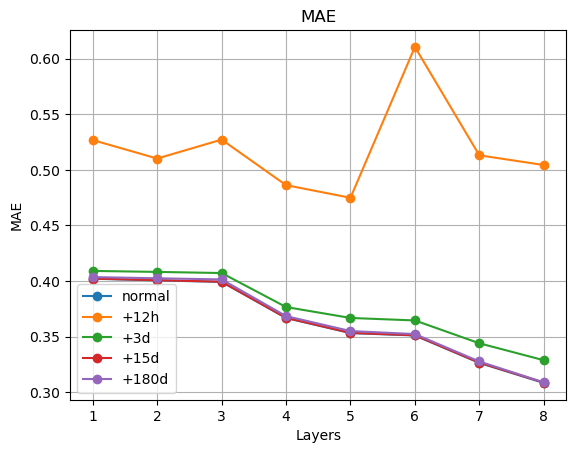

label:  normal
label:  +12h
label:  +3d
label:  +15d
label:  +180d


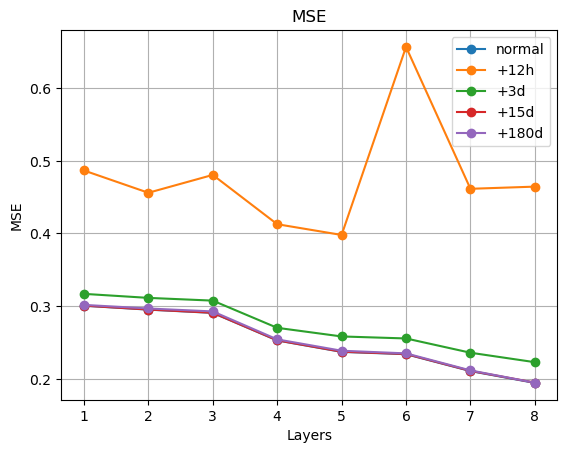

label:  normal
label:  +12h
label:  +3d
label:  +15d
label:  +180d


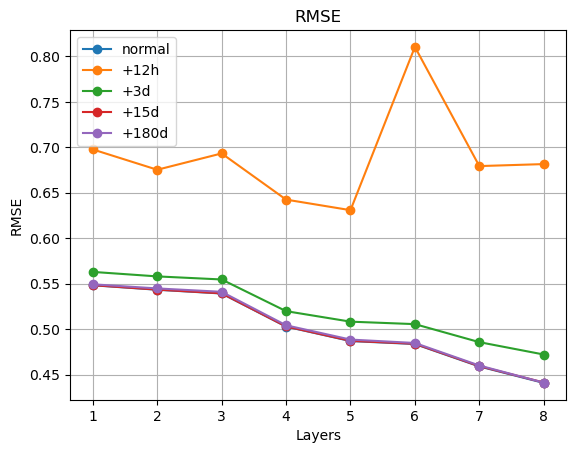

label:  normal
label:  +12h
label:  +3d
label:  +15d
label:  +180d


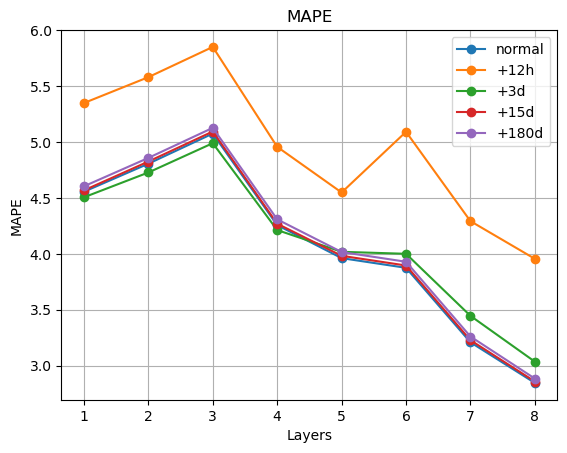

label:  normal
label:  +12h
label:  +3d
label:  +15d
label:  +180d


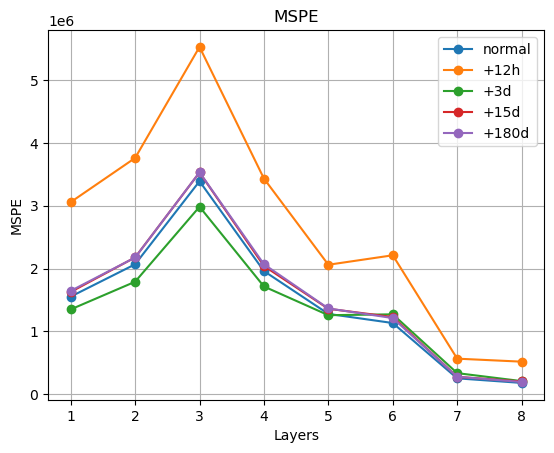

label:  normal
label:  +12h
label:  +3d
label:  +15d
label:  +180d


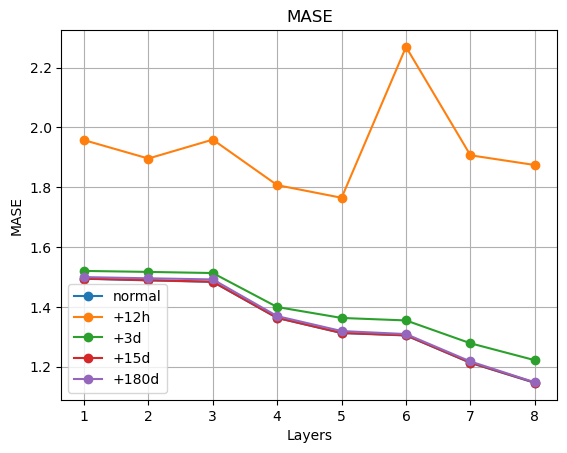

In [20]:
import matplotlib.pyplot as plt

# Plot each metric
for metric_name in metrics.keys():
    plt.figure()
    for desc, data in metrics_dict.items():
        print("label: ", desc)
        # print("data: ", data)
        plt.plot(
            [i + 1 for i in list(data[metric_name].keys())],
            list(data[metric_name].values()),
            marker="o",
            label=desc,
        )

    # plt.plot(
    #     [i + 1 for i in list(metrics_12hod[metric_name].keys())],
    #     list(metrics_3dow[metric_name].values()),
    #     marker="o",
    #     label="+3dow",
    # )
    # plt.plot(
    #     [i + 1 for i in list(metrics[metric_name].keys())],
    #     list(metrics_12hod[metric_name].values()),
    #     marker="o",
    #     label="3dow",
    # )
    plt.title(f"{metric_name.upper()}")
    plt.xlabel("Layers")
    plt.ylabel(metric_name.upper())
    plt.grid(True)
    plt.legend()
    plt.show()

TODO: Look into exact embeddings of the time stamps, and try to do CKA analysis with time embeddings

## 2. Decode time stamps

In [21]:
data_loader = obtain_data_loader(pred_len=96, dataset="electricity", split="test")
autoformer = data_utils.obtain_autoformer(pred_len=96, dataset="ECL")

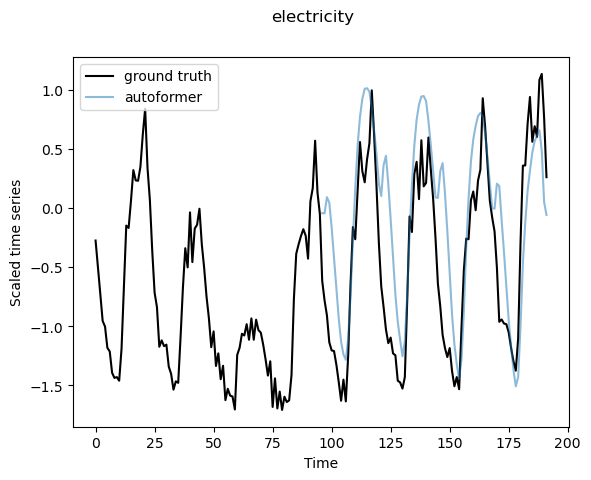

In [22]:
data_utils.obtain_plot_predictions(
    pred_len=96,
    data_set="electricity",
    data_loader=data_loader,
    model=autoformer,
)

In [23]:
for seq_x, seq_y, seq_x_mark, seq_y_mark in data_loader:
    seq_x, seq_y, seq_x_mark, seq_y_mark = seq_x, seq_y, seq_x_mark, seq_y_mark
    break

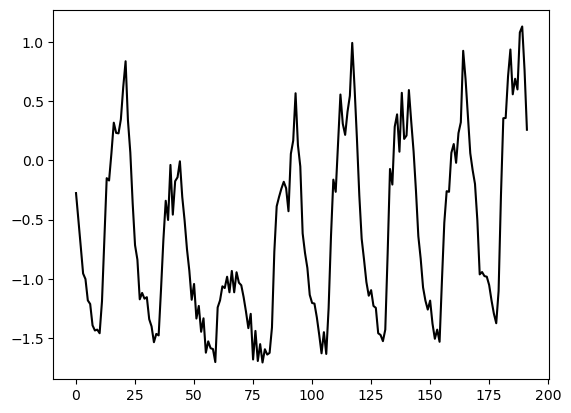

In [24]:
pred_len = 96
gt = np.concatenate((seq_x[0, :, -1], seq_y[0, -pred_len:, -1]), axis=0)
plt.plot(gt, label="ground truth", color="black")

In [25]:
print(seq_x_mark.shape)
seq_x_mark = seq_x_mark.squeeze()
print(seq_x_mark.shape)

torch.Size([1, 96, 4])
torch.Size([96, 4])


In [26]:
def time_features_from_frequency_str_uncalled(freq_str: str) -> List[TimeFeature]:
    """
    Returns a list of time features that will be appropriate for the given frequency string.
    Parameters
    ----------
    freq_str
        Frequency string of the form [multiple][granularity] such as "12H", "5min", "1D" etc.
    """

    features_by_offsets = {
        offsets.YearEnd: [],
        offsets.QuarterEnd: [MonthOfYear],
        offsets.MonthEnd: [MonthOfYear],
        offsets.Week: [DayOfMonth, WeekOfYear],
        offsets.Day: [DayOfWeek, DayOfMonth, DayOfYear],
        offsets.BusinessDay: [DayOfWeek, DayOfMonth, DayOfYear],
        offsets.Hour: [HourOfDay, DayOfWeek, DayOfMonth, DayOfYear],
        offsets.Minute: [
            MinuteOfHour,
            HourOfDay,
            DayOfWeek,
            DayOfMonth,
            DayOfYear,
        ],
        offsets.Second: [
            SecondOfMinute,
            MinuteOfHour,
            HourOfDay,
            DayOfWeek,
            DayOfMonth,
            DayOfYear,
        ],
    }

    offset = to_offset(freq_str)

    for offset_type, feature_classes in features_by_offsets.items():
        if isinstance(offset, offset_type):
            return [cls for cls in feature_classes]

    supported_freq_msg = f"""
    Unsupported frequency {freq_str}
    The following frequencies are supported:
        Y   - yearly
            alias: A
        M   - monthly
        W   - weekly
        D   - daily
        B   - business days
        H   - hourly
        T   - minutely
            alias: min
        S   - secondly
    """
    raise RuntimeError(supported_freq_msg)

In [27]:
time_feat = time_features_from_frequency_str_uncalled("h")
print(time_feat)

[<class '__main__.HourOfDay'>, <class '__main__.DayOfWeek'>, <class '__main__.DayOfMonth'>, <class '__main__.DayOfYear'>]


In [28]:
hourofday = seq_x_mark[:, 0]
print(hourofday)

tensor([ 0.4565,  0.5000, -0.5000, -0.4565, -0.4130, -0.3696, -0.3261, -0.2826,
        -0.2391, -0.1957, -0.1522, -0.1087, -0.0652, -0.0217,  0.0217,  0.0652,
         0.1087,  0.1522,  0.1957,  0.2391,  0.2826,  0.3261,  0.3696,  0.4130,
         0.4565,  0.5000, -0.5000, -0.4565, -0.4130, -0.3696, -0.3261, -0.2826,
        -0.2391, -0.1957, -0.1522, -0.1087, -0.0652, -0.0217,  0.0217,  0.0652,
         0.1087,  0.1522,  0.1957,  0.2391,  0.2826,  0.3261,  0.3696,  0.4130,
         0.4565,  0.5000, -0.5000, -0.4565, -0.4130, -0.3696, -0.3261, -0.2826,
        -0.2391, -0.1957, -0.1522, -0.1087, -0.0652, -0.0217,  0.0217,  0.0652,
         0.1087,  0.1522,  0.1957,  0.2391,  0.2826,  0.3261,  0.3696,  0.4130,
         0.4565,  0.5000, -0.5000, -0.4565, -0.4130, -0.3696, -0.3261, -0.2826,
        -0.2391, -0.1957, -0.1522, -0.1087, -0.0652, -0.0217,  0.0217,  0.0652,
         0.1087,  0.1522,  0.1957,  0.2391,  0.2826,  0.3261,  0.3696,  0.4130],
       dtype=torch.float64)


In [29]:
def hourofday_inverse(input):
    return (input + 0.5) * 23

In [30]:
hourofday_inverse(hourofday)

tensor([22.0000, 23.0000,  0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,
         6.0000,  7.0000,  8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000,
        14.0000, 15.0000, 16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000,
        22.0000, 23.0000,  0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,
         6.0000,  7.0000,  8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000,
        14.0000, 15.0000, 16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000,
        22.0000, 23.0000,  0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,
         6.0000,  7.0000,  8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000,
        14.0000, 15.0000, 16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000,
        22.0000, 23.0000,  0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,
         6.0000,  7.0000,  8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000,
        14.0000, 15.0000, 16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000],
       dtype=torch.float64)

In [31]:
HourOfDay.inverse(hourofday)

tensor([22.0000, 23.0000,  0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,
         6.0000,  7.0000,  8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000,
        14.0000, 15.0000, 16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000,
        22.0000, 23.0000,  0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,
         6.0000,  7.0000,  8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000,
        14.0000, 15.0000, 16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000,
        22.0000, 23.0000,  0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,
         6.0000,  7.0000,  8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000,
        14.0000, 15.0000, 16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000,
        22.0000, 23.0000,  0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,
         6.0000,  7.0000,  8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000,
        14.0000, 15.0000, 16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000],
       dtype=torch.float64)

In [32]:
for i, feat in enumerate(time_feat):
    print(feat.inverse(seq_x_mark[:, i]))

tensor([22.0000, 23.0000,  0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,
         6.0000,  7.0000,  8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000,
        14.0000, 15.0000, 16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000,
        22.0000, 23.0000,  0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,
         6.0000,  7.0000,  8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000,
        14.0000, 15.0000, 16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000,
        22.0000, 23.0000,  0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,
         6.0000,  7.0000,  8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000,
        14.0000, 15.0000, 16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000,
        22.0000, 23.0000,  0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,
         6.0000,  7.0000,  8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000,
        14.0000, 15.0000, 16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000],
       dtype=torch.float64)
tensor([1.0

In [33]:
print(seq_x_mark.shape)

torch.Size([96, 4])


In [34]:
import torch

seq_x_mark_hourofday = []
seq_x_mark_dayofweek = []
seq_x_mark_dayofmonth = []
seq_x_mark_dayofyear = []

seq_x_mark_all = [[], [], [], []]

for seq_x, seq_y, seq_x_mark, seq_y_mark in data_loader:
    seq_x_mark = seq_x_mark.squeeze()
    for i, feat in enumerate(time_feat):
        seq_x_mark_all[i].append(feat.inverse(seq_x_mark[:, i]))

for i in range(4):
    seq_x_mark_all[i] = torch.stack(seq_x_mark_all[i])
    seq_x_mark_all[i] = seq_x_mark_all[i].unique()
    print(seq_x_mark_all[i])
    # print(len(seq_x_mark_all[i]))
    # print(seq_x_mark_all[i])
    # print(seq_x_mark_all[i][0].shape)
    # torch.stack(seq_x_mark_all[i], dim=0)

tensor([ 0.0000,  1.0000,  2.0000,  3.0000,  4.0000,  5.0000,  6.0000,  7.0000,
         8.0000,  9.0000, 10.0000, 11.0000, 12.0000, 13.0000, 14.0000, 15.0000,
        16.0000, 17.0000, 18.0000, 19.0000, 20.0000, 21.0000, 22.0000, 23.0000],
       dtype=torch.float64)
tensor([0.0000, 1.0000, 2.0000, 3.0000, 4.0000, 5.0000, 6.0000],
       dtype=torch.float64)
tensor([ 1.0000,  2.0000,  3.0000,  4.0000,  5.0000,  6.0000,  7.0000,  8.0000,
         9.0000, 10.0000, 11.0000, 12.0000, 13.0000, 14.0000, 15.0000, 16.0000,
        17.0000, 18.0000, 19.0000, 20.0000, 21.0000, 22.0000, 23.0000, 24.0000,
        25.0000, 26.0000, 27.0000, 28.0000, 29.0000, 30.0000, 31.0000],
       dtype=torch.float64)
tensor([  1.0000,   2.0000,   3.0000,   4.0000,   5.0000,   6.0000,   7.0000,
          8.0000,   9.0000,  10.0000,  11.0000,  12.0000,  13.0000,  14.0000,
         15.0000,  16.0000,  17.0000,  18.0000,  19.0000,  20.0000,  21.0000,
         22.0000,  23.0000,  24.0000,  25.0000,  26.0000,  27.00

In [35]:
def day_of_year_to_date(day_of_year):
    # Define the number of days in each month
    days_in_month = [31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]

    # # Check for leap year
    # is_leap_year = lambda year: (year % 4 == 0 and year % 100 != 0) or (year % 400 == 0)

    # Initialize month and day
    month = 1
    day = int(day_of_year)

    # Update day and month based on the number of days in each month
    while day > days_in_month[month - 1]:
        day -= days_in_month[month - 1]
        # if month == 2 and is_leap_year(year):
        #     day -= 1
        month += 1

    # Define month names
    month_names = [
        "Jan",
        "Feb",
        "Mar",
        "Apr",
        "May",
        "Jun",
        "Jul",
        "Aug",
        "Sep",
        "Oct",
        "Nov",
        "Dec",
    ]

    # Return the date
    return f"{month_names[month - 1]} {day}"


# Example usage
day_of_year = 365  # Example: December 31st
print(day_of_year_to_date(day_of_year))

Dec 31


In [36]:
jan1st = pd.to_datetime("2000-01-31 12:31:00")
jan1st.day

31

In [37]:
time_feat

[__main__.HourOfDay,
 __main__.DayOfWeek,
 __main__.DayOfMonth,
 __main__.DayOfYear]

In [38]:
def obtain_timestamps(seq_mark, time_feat):
    daysofweek = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]

    timestamps = []

    seq_mark = seq_mark.squeeze()
    for i, feat in enumerate(time_feat):
        seq_mark[:, i] = feat.inverse(seq_mark[:, i])
    for timestamp in range(seq_mark.shape[0]):
        time = f"{round(seq_mark[timestamp,0].item())}H"
        weekday = daysofweek[round(seq_mark[timestamp, 1].item())]
        date = day_of_year_to_date(seq_mark[timestamp, 3])
        timestamps.append(f"{time} {weekday} {date}")
    return timestamps

In [39]:
daysofweek = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]

timestamps = []
for seq_x, seq_y, seq_x_mark, seq_y_mark in data_loader:
    seq_x_mark = seq_x_mark.squeeze()
    timestamps = obtain_timestamps(seq_x_mark, time_feat)
    print(timestamps)
    # print()
    # for i, feat in enumerate(time_feat):
    #     seq_x_mark[:,i] = feat.inverse(seq_x_mark[:, i])
    # for timestamp in range(seq_x_mark.shape[0]):
    #     time = f"{int(seq_x_mark[timestamp,0])}H"
    #     weekday = daysofweek[int(seq_x_mark[timestamp,1].item())]
    #     date = day_of_year_to_date(seq_x_mark[timestamp,3])
    #     timestamps.append(f"{time} {weekday} {date}")
    # break

print(timestamps)

['22H Tue Nov 20', '23H Tue Nov 20', '0H Wed Nov 21', '1H Wed Nov 21', '2H Wed Nov 21', '3H Wed Nov 21', '4H Wed Nov 21', '5H Wed Nov 21', '6H Wed Nov 21', '7H Wed Nov 21', '8H Wed Nov 21', '9H Wed Nov 21', '10H Wed Nov 21', '11H Wed Nov 21', '12H Wed Nov 21', '13H Wed Nov 21', '14H Wed Nov 21', '15H Wed Nov 21', '16H Wed Nov 21', '17H Wed Nov 21', '18H Wed Nov 21', '19H Wed Nov 21', '20H Wed Nov 21', '21H Wed Nov 21', '22H Wed Nov 21', '23H Wed Nov 21', '0H Thu Nov 22', '1H Thu Nov 22', '2H Thu Nov 22', '3H Thu Nov 22', '4H Thu Nov 22', '5H Thu Nov 22', '6H Thu Nov 22', '7H Thu Nov 22', '8H Thu Nov 22', '9H Thu Nov 22', '10H Thu Nov 22', '11H Thu Nov 22', '12H Thu Nov 22', '13H Thu Nov 22', '14H Thu Nov 22', '15H Thu Nov 22', '16H Thu Nov 22', '17H Thu Nov 22', '18H Thu Nov 22', '19H Thu Nov 22', '20H Thu Nov 22', '21H Thu Nov 22', '22H Thu Nov 22', '23H Thu Nov 22', '0H Fri Nov 23', '1H Fri Nov 23', '2H Fri Nov 23', '3H Fri Nov 23', '4H Fri Nov 23', '5H Fri Nov 23', '6H Fri Nov 23', 

In [40]:
def obtain_plot_predictions(
    pred_len,
    data_set,
    data_loader,
    model,
    stimulus=None,
    name_plot="",
    to_save=False,
    name_fig="",
    label_len=48,
    item=0,
    alpha_gt=1,
    alpha_pred=0.5,
    vlines=[],
):
    with torch.no_grad():
        for i, (seq_x, seq_y, seq_x_mark, seq_y_mark) in enumerate(data_loader):
            if i == item:
                # seq_x is batch_size x seq_len x N_timeseries
                # seq_y is batch_size x label_len x N_timeseries
                # seq_x_mark is batch_size x seq_len X N_timefeatures
                # seq_y_mark is batch_size x (label_len+pred_len) X N_timefeatures
                if stimulus is not None:
                    seq_x, seq_y, seq_x_mark, seq_y_mark = stimulus

                # decoder input
                dec_inp = torch.zeros_like(seq_y[:, -pred_len:, :]).float()
                dec_inp = torch.cat([seq_y[:, :label_len, :], dec_inp], dim=1).float()

                # gt = np.concatenate((seq_x[0, :, 0], seq_y[0, -pred_len:, 0]), axis=0)
                gt = np.concatenate((seq_x[0, :, -1], seq_y[0, -pred_len:, -1]), axis=0)

                outputs_autoformer, _ = model(
                    seq_x.float(), seq_x_mark.float(), dec_inp, seq_y_mark.float()
                )
                pd_autoformer = np.concatenate(
                    (
                        [np.nan for i in range(seq_x.shape[1])],
                        outputs_autoformer[0, -pred_len:, -1],
                    ),
                    axis=0,
                )

                time_feat = time_features_from_frequency_str_uncalled("h")
                x_timestamps = obtain_timestamps(seq_x_mark, time_feat)
                y_timestamps = obtain_timestamps(seq_y_mark, time_feat)[-pred_len:]
                timestamps = x_timestamps + y_timestamps
                print(timestamps)

                plt.plot(gt, label="ground truth", color="black", alpha=alpha_gt)
                plt.plot(pd_autoformer, label="autoformer", alpha=alpha_pred)

                for vline in vlines:
                    plt.axvline(x=vline, color="b", linestyle="--")

                plt.legend()
                plt.xlabel("Time")
                plt.ylabel("Scaled time series")
                plt.suptitle(data_set)
                plt.grid(True)

                tick_positions = [
                    i
                    for i, tick_label in enumerate(timestamps)
                    if tick_label.startswith("0H")
                ]
                tick_labels = [timestamps[i][3:] for i in tick_positions]
                plt.xticks(tick_positions, tick_labels, rotation=45)

                if to_save:
                    # plt.savefig(f"plots/{name_plot}.png")
                    plt.savefig(name_fig, bbox_inches="tight")
                plt.show()

['22H Tue Nov 20', '23H Tue Nov 20', '0H Wed Nov 21', '1H Wed Nov 21', '2H Wed Nov 21', '3H Wed Nov 21', '4H Wed Nov 21', '5H Wed Nov 21', '6H Wed Nov 21', '7H Wed Nov 21', '8H Wed Nov 21', '9H Wed Nov 21', '10H Wed Nov 21', '11H Wed Nov 21', '12H Wed Nov 21', '13H Wed Nov 21', '14H Wed Nov 21', '15H Wed Nov 21', '16H Wed Nov 21', '17H Wed Nov 21', '18H Wed Nov 21', '19H Wed Nov 21', '20H Wed Nov 21', '21H Wed Nov 21', '22H Wed Nov 21', '23H Wed Nov 21', '0H Thu Nov 22', '1H Thu Nov 22', '2H Thu Nov 22', '3H Thu Nov 22', '4H Thu Nov 22', '5H Thu Nov 22', '6H Thu Nov 22', '7H Thu Nov 22', '8H Thu Nov 22', '9H Thu Nov 22', '10H Thu Nov 22', '11H Thu Nov 22', '12H Thu Nov 22', '13H Thu Nov 22', '14H Thu Nov 22', '15H Thu Nov 22', '16H Thu Nov 22', '17H Thu Nov 22', '18H Thu Nov 22', '19H Thu Nov 22', '20H Thu Nov 22', '21H Thu Nov 22', '22H Thu Nov 22', '23H Thu Nov 22', '0H Fri Nov 23', '1H Fri Nov 23', '2H Fri Nov 23', '3H Fri Nov 23', '4H Fri Nov 23', '5H Fri Nov 23', '6H Fri Nov 23', 

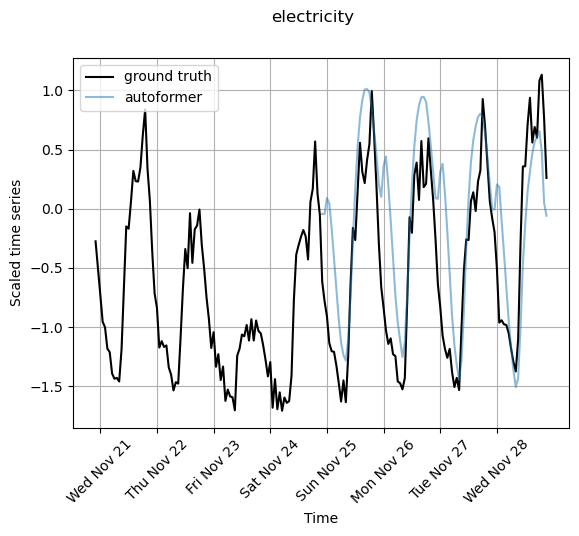

In [41]:
obtain_plot_predictions(
    pred_len=96,
    data_set="electricity",
    data_loader=data_loader,
    model=autoformer,
)

['10H Tue Nov 20', '11H Tue Nov 20', '12H Wed Nov 21', '13H Wed Nov 21', '14H Wed Nov 21', '15H Wed Nov 21', '16H Wed Nov 21', '17H Wed Nov 21', '18H Wed Nov 21', '19H Wed Nov 21', '20H Wed Nov 21', '21H Wed Nov 21', '22H Wed Nov 21', '23H Wed Nov 21', '0H Wed Nov 21', '1H Wed Nov 21', '2H Wed Nov 21', '3H Wed Nov 21', '4H Wed Nov 21', '5H Wed Nov 21', '6H Wed Nov 21', '7H Wed Nov 21', '8H Wed Nov 21', '9H Wed Nov 21', '10H Wed Nov 21', '11H Wed Nov 21', '12H Thu Nov 22', '13H Thu Nov 22', '14H Thu Nov 22', '15H Thu Nov 22', '16H Thu Nov 22', '17H Thu Nov 22', '18H Thu Nov 22', '19H Thu Nov 22', '20H Thu Nov 22', '21H Thu Nov 22', '22H Thu Nov 22', '23H Thu Nov 22', '0H Thu Nov 22', '1H Thu Nov 22', '2H Thu Nov 22', '3H Thu Nov 22', '4H Thu Nov 22', '5H Thu Nov 22', '6H Thu Nov 22', '7H Thu Nov 22', '8H Thu Nov 22', '9H Thu Nov 22', '10H Thu Nov 22', '11H Thu Nov 22', '12H Fri Nov 23', '13H Fri Nov 23', '14H Fri Nov 23', '15H Fri Nov 23', '16H Fri Nov 23', '17H Fri Nov 23', '18H Fri No

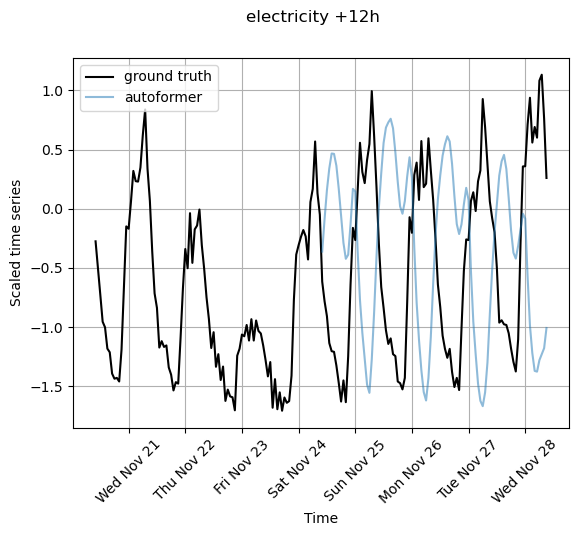

In [42]:
data_loader_12h = obtain_data_loader(
    pred_len=96, dataset="electricity", split="test", HourOfDay_offset=12
)
obtain_plot_predictions(
    pred_len=96,
    data_set="electricity +12h",
    data_loader=data_loader_12h,
    model=autoformer,
)

## 3. Ablation data and timestamps for predicting

In [44]:
data_loader = obtain_data_loader(pred_len=96, dataset="electricity", split="test")
autoformer = data_utils.obtain_autoformer(pred_len=96, dataset="ECL")

In [51]:
hi = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
hi[-3:]

[7, 8, 9]

In [73]:
def obtain_plot_predictions(
    pred_len,
    data_set,
    data_loader,
    model,
    stimulus=None,
    name_plot="",
    to_save=False,
    name_fig="",
    label_len=48,
    item=0,
    alpha_gt=1,
    alpha_pred=0.5,
    vlines=[],
):
    with torch.no_grad():
        for i, (seq_x, seq_y, seq_x_mark, seq_y_mark) in enumerate(data_loader):
            if i == item:
                # seq_x is batch_size x seq_len x N_timeseries
                # seq_y is batch_size x label_len x N_timeseries
                # seq_x_mark is batch_size x seq_len X N_timefeatures
                # seq_y_mark is batch_size x (label_len+pred_len) X N_timefeatures
                if stimulus is not None:
                    seq_x, seq_y, seq_x_mark, seq_y_mark = stimulus

                # decoder input
                dec_inp = torch.zeros_like(seq_y[:, -pred_len:, :]).float()
                # dec_inp = torch.cat([seq_y[:, :label_len, :], dec_inp], dim=1).float()
                dec_inp = torch.cat([dec_inp[:, :label_len, :], dec_inp], dim=1).float()

                # gt = np.concatenate((seq_x[0, :, 0], seq_y[0, -pred_len:, 0]), axis=0)

                seq_x_zero = torch.zeros_like(seq_x)
                gt = np.concatenate(
                    (seq_x_zero[0, :, -1], seq_y[0, -pred_len:, -1]), axis=0
                )

                outputs_autoformer, _ = model(
                    seq_x_zero.float(), seq_x_mark.float(), dec_inp, seq_y_mark.float()
                )
                pd_autoformer = np.concatenate(
                    (
                        [np.nan for i in range(seq_x.shape[1])],
                        outputs_autoformer[0, -pred_len:, -1],
                    ),
                    axis=0,
                )

                time_feat = time_features_from_frequency_str_uncalled("h")
                x_timestamps = obtain_timestamps(seq_x_mark, time_feat)
                y_timestamps = obtain_timestamps(seq_y_mark, time_feat)[-pred_len:]
                timestamps = x_timestamps + y_timestamps
                print(timestamps)

                plt.plot(gt, label="ground truth", color="black", alpha=alpha_gt)
                plt.plot(pd_autoformer, label="autoformer", alpha=alpha_pred)

                for vline in vlines:
                    plt.axvline(x=vline, color="b", linestyle="--")

                plt.legend()
                plt.xlabel("Time")
                plt.ylabel("Scaled time series")
                plt.suptitle(data_set)
                plt.grid(True)

                tick_positions = [
                    i
                    for i, tick_label in enumerate(timestamps)
                    if tick_label.startswith("0H")
                ]
                tick_labels = [timestamps[i][3:] for i in tick_positions]
                plt.xticks(tick_positions, tick_labels, rotation=45)

                if to_save:
                    # plt.savefig(f"plots/{name_plot}.png")
                    plt.savefig(name_fig, bbox_inches="tight")
                plt.show()

In [70]:
test_string = "{}{}_{}".format("hi" if True else "", "_bye" if False else "", "yes")
test_string

'hi_yes'

['22H Tue Nov 20', '23H Tue Nov 20', '0H Wed Nov 21', '1H Wed Nov 21', '2H Wed Nov 21', '3H Wed Nov 21', '4H Wed Nov 21', '5H Wed Nov 21', '6H Wed Nov 21', '7H Wed Nov 21', '8H Wed Nov 21', '9H Wed Nov 21', '10H Wed Nov 21', '11H Wed Nov 21', '12H Wed Nov 21', '13H Wed Nov 21', '14H Wed Nov 21', '15H Wed Nov 21', '16H Wed Nov 21', '17H Wed Nov 21', '18H Wed Nov 21', '19H Wed Nov 21', '20H Wed Nov 21', '21H Wed Nov 21', '22H Wed Nov 21', '23H Wed Nov 21', '0H Thu Nov 22', '1H Thu Nov 22', '2H Thu Nov 22', '3H Thu Nov 22', '4H Thu Nov 22', '5H Thu Nov 22', '6H Thu Nov 22', '7H Thu Nov 22', '8H Thu Nov 22', '9H Thu Nov 22', '10H Thu Nov 22', '11H Thu Nov 22', '12H Thu Nov 22', '13H Thu Nov 22', '14H Thu Nov 22', '15H Thu Nov 22', '16H Thu Nov 22', '17H Thu Nov 22', '18H Thu Nov 22', '19H Thu Nov 22', '20H Thu Nov 22', '21H Thu Nov 22', '22H Thu Nov 22', '23H Thu Nov 22', '0H Fri Nov 23', '1H Fri Nov 23', '2H Fri Nov 23', '3H Fri Nov 23', '4H Fri Nov 23', '5H Fri Nov 23', '6H Fri Nov 23', 

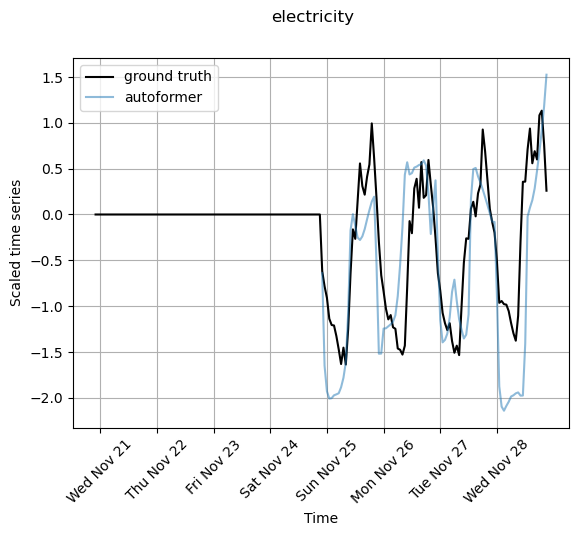

In [74]:
obtain_plot_predictions(
    pred_len=96,
    data_set="electricity",
    data_loader=data_loader,
    model=autoformer,
)

['22H Wed Nov 21', '23H Wed Nov 21', '0H Thu Nov 22', '1H Thu Nov 22', '2H Thu Nov 22', '3H Thu Nov 22', '4H Thu Nov 22', '5H Thu Nov 22', '6H Thu Nov 22', '7H Thu Nov 22', '8H Thu Nov 22', '9H Thu Nov 22', '10H Thu Nov 22', '11H Thu Nov 22', '12H Thu Nov 22', '13H Thu Nov 22', '14H Thu Nov 22', '15H Thu Nov 22', '16H Thu Nov 22', '17H Thu Nov 22', '18H Thu Nov 22', '19H Thu Nov 22', '20H Thu Nov 22', '21H Thu Nov 22', '22H Thu Nov 22', '23H Thu Nov 22', '0H Fri Nov 23', '1H Fri Nov 23', '2H Fri Nov 23', '3H Fri Nov 23', '4H Fri Nov 23', '5H Fri Nov 23', '6H Fri Nov 23', '7H Fri Nov 23', '8H Fri Nov 23', '9H Fri Nov 23', '10H Fri Nov 23', '11H Fri Nov 23', '12H Fri Nov 23', '13H Fri Nov 23', '14H Fri Nov 23', '15H Fri Nov 23', '16H Fri Nov 23', '17H Fri Nov 23', '18H Fri Nov 23', '19H Fri Nov 23', '20H Fri Nov 23', '21H Fri Nov 23', '22H Fri Nov 23', '23H Fri Nov 23', '0H Sat Nov 24', '1H Sat Nov 24', '2H Sat Nov 24', '3H Sat Nov 24', '4H Sat Nov 24', '5H Sat Nov 24', '6H Sat Nov 24', 

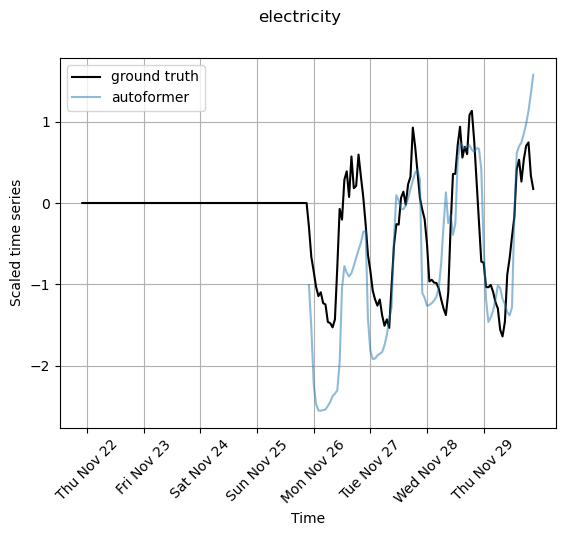

In [75]:
obtain_plot_predictions(
    pred_len=96,
    data_set="electricity",
    data_loader=data_loader,
    model=autoformer,
    item=24,
)

In [76]:
seq_x_mark_all = []

for seq_x, seq_y, seq_x_mark, seq_y_mark in data_loader:
    seq_x_mark_all.append(seq_x_mark.squeeze())
print(seq_x_mark.shape)

seq_x_mark_all = torch.vstack(seq_x_mark_all)
print(seq_x_mark_all.shape)

torch.Size([1, 96, 4])
torch.Size([495840, 4])


In [80]:
print(torch.round(torch.mean(seq_x_mark_all, dim=0), decimals=3))
# print(torch.mean(seq_x_all.mean(dim=1), dim=0))
# print(torch.mean(seq_x_all.mean(dim=0), dim=0))

tensor([-0.0000,  0.0010, -0.0070, -0.1320], dtype=torch.float64)


In [85]:
def obtain_plot_predictions(
    pred_len,
    data_set,
    data_loader,
    model,
    stimulus=None,
    name_plot="",
    to_save=False,
    name_fig="",
    label_len=48,
    item=0,
    alpha_gt=1,
    alpha_pred=0.5,
    vlines=[],
):
    with torch.no_grad():
        for i, (seq_x, seq_y, seq_x_mark, seq_y_mark) in enumerate(data_loader):
            if i == item:
                # seq_x is batch_size x seq_len x N_timeseries
                # seq_y is batch_size x label_len x N_timeseries
                # seq_x_mark is batch_size x seq_len X N_timefeatures
                # seq_y_mark is batch_size x (label_len+pred_len) X N_timefeatures
                if stimulus is not None:
                    seq_x, seq_y, seq_x_mark, seq_y_mark = stimulus

                # decoder input
                dec_inp = torch.zeros_like(seq_y[:, -pred_len:, :]).float()
                dec_inp = torch.cat([seq_y[:, :label_len, :], dec_inp], dim=1).float()
                # dec_inp = torch.cat([dec_inp[:, :label_len, :], dec_inp], dim=1).float()

                # gt = np.concatenate((seq_x[0, :, 0], seq_y[0, -pred_len:, 0]), axis=0)

                gt = np.concatenate((seq_x[0, :, -1], seq_y[0, -pred_len:, -1]), axis=0)

                seq_x_mark = torch.zeros_like(seq_x_mark)
                seq_y_mark = torch.zeros_like(seq_y_mark)

                outputs_autoformer, _ = model(
                    seq_x.float(), seq_x_mark.float(), dec_inp, seq_y_mark.float()
                )
                pd_autoformer = np.concatenate(
                    (
                        [np.nan for i in range(seq_x.shape[1])],
                        outputs_autoformer[0, -pred_len:, -1],
                    ),
                    axis=0,
                )

                time_feat = time_features_from_frequency_str_uncalled("h")
                x_timestamps = obtain_timestamps(seq_x_mark, time_feat)
                y_timestamps = obtain_timestamps(seq_y_mark, time_feat)[-pred_len:]
                timestamps = x_timestamps + y_timestamps
                print(timestamps)

                plt.plot(gt, label="ground truth", color="black", alpha=alpha_gt)
                plt.plot(pd_autoformer, label="autoformer", alpha=alpha_pred)

                for vline in vlines:
                    plt.axvline(x=vline, color="b", linestyle="--")

                plt.legend()
                plt.xlabel("Time")
                plt.ylabel("Scaled time series")
                plt.suptitle(data_set)
                plt.grid(True)

                tick_positions = [
                    i for i, tick_label in enumerate(timestamps) if i % 24 == 0
                ]
                tick_labels = [timestamps[i] for i in tick_positions]
                plt.xticks(tick_positions, tick_labels, rotation=45)

                if to_save:
                    # plt.savefig(f"plots/{name_plot}.png")
                    plt.savefig(name_fig, bbox_inches="tight")
                plt.show()

['12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 

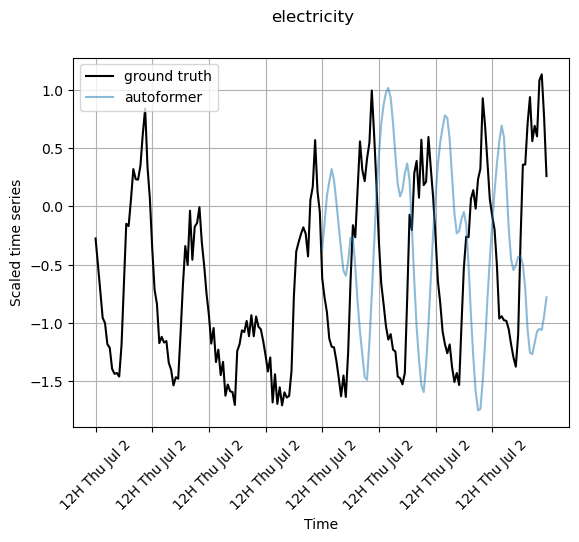

In [86]:
obtain_plot_predictions(
    pred_len=96,
    data_set="electricity",
    data_loader=data_loader,
    model=autoformer,
)

['12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 2', '12H Thu Jul 

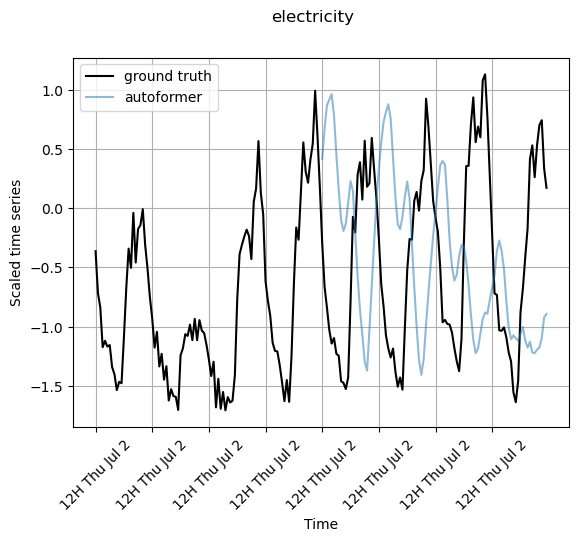

In [87]:
obtain_plot_predictions(
    pred_len=96,
    data_set="electricity",
    data_loader=data_loader,
    model=autoformer,
    item=24,
)

In [5]:
import numpy as np

# path = "../results/"
# name_12hod = "seed42_ECL_96_96_Autoformer_custom_12hod_0dow_0dom_0doy_ftM_sl96_ll48_pl96_dm512_nh8_el8_dl1_df2048_fc3_ebtimeF_dtTrue_Exp_0/metrics.npy"

# metrics_12hod = np.load(path + name_12hod, allow_pickle=True)
# metrics_12hod = metrics_12hod.item()

# name_3dow = "seed42_ECL_96_96_Autoformer_custom_0hod_3dow_0dom_0doy_ftM_sl96_ll48_pl96_dm512_nh8_el8_dl1_df2048_fc3_ebtimeF_dtTrue_Exp_0/metrics.npy"

# metrics_3dow = np.load(path + name_3dow, allow_pickle=True)
# metrics_3dow = metrics_3dow.item()

# name_15dom = "seed42_ECL_96_96_Autoformer_custom_0hod_0dow_15dom_0doy_ftM_sl96_ll48_pl96_dm512_nh8_el8_dl1_df2048_fc3_ebtimeF_dtTrue_Exp_0/metrics.npy"

# metrics_15dom = np.load(path + name_15dom, allow_pickle=True)
# metrics_15dom = metrics_15dom.item()

# name_180doy = "seed42_ECL_96_96_Autoformer_custom_0hod_0dow_0dom_180doy_ftM_sl96_ll48_pl96_dm512_nh8_el8_dl1_df2048_fc3_ebtimeF_dtTrue_Exp_0/metrics.npy"

# metrics_180doy = np.load(path + name_180doy, allow_pickle=True)
# metrics_180doy = metrics_180doy.item()

name = "seed42_ECL_96_96_Autoformer_custom_ftM_sl96_ll48_pl96_dm512_nh8_el8_dl1_df2048_fc3_ebtimeF_dtTrue_Exp_0/metrics.npy"

metrics = np.load(path + name, allow_pickle=True)
metrics = metrics.item()

name = "seed42_ECL_96_96_Autoformer_custom_empty_data_0hod_0dow_0dom_0doy_ftM_sl96_ll48_pl96_dm512_nh8_el8_dl1_df2048_fc3_ebtimeF_dtTrue_Exp_0/metrics.npy"

metrics_empty_data = np.load(path + name, allow_pickle=True)
metrics_empty_data = metrics_empty_data.item()

name = "seed42_ECL_96_96_Autoformer_custom_empty_time_0hod_0dow_0dom_0doy_ftM_sl96_ll48_pl96_dm512_nh8_el8_dl1_df2048_fc3_ebtimeF_dtTrue_Exp_0/metrics.npy"

metrics_empty_time = np.load(path + name, allow_pickle=True)
metrics_empty_time = metrics_empty_time.item()

metrics_dict = {
    "normal": metrics,
    # "+12h": metrics_12hod,
    # "+3d": metrics_3dow,
    # "+15d": metrics_15dom,
    # "+180d": metrics_180doy,
    "zero data": metrics_empty_data,
    "zero time": metrics_empty_time,
}

label:  normal
label:  zero data
label:  zero time


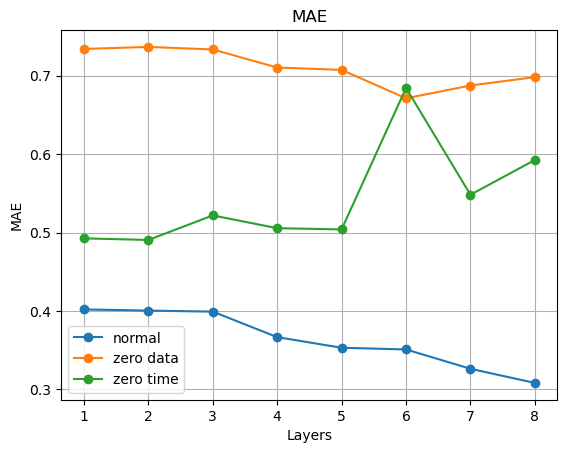

label:  normal
label:  zero data
label:  zero time


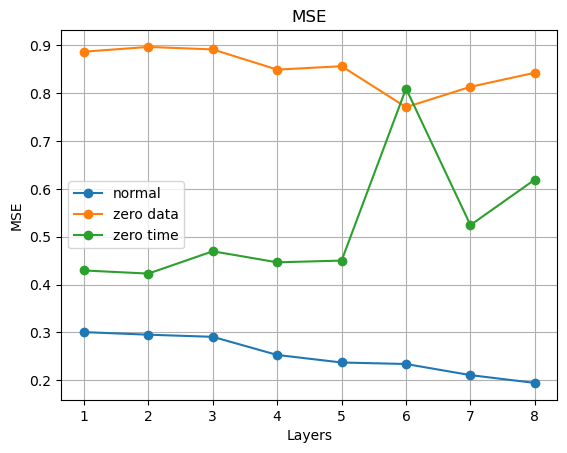

label:  normal
label:  zero data
label:  zero time


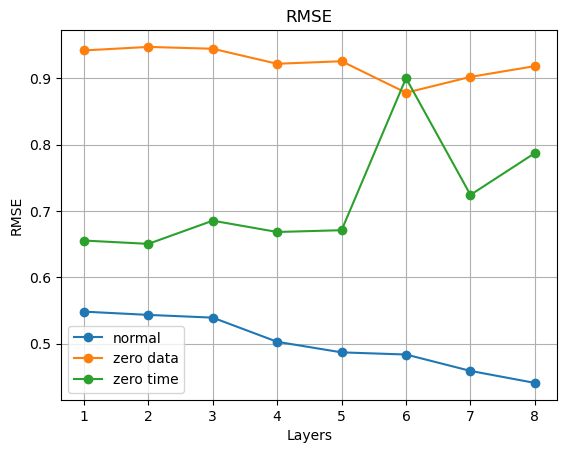

label:  normal
label:  zero data
label:  zero time


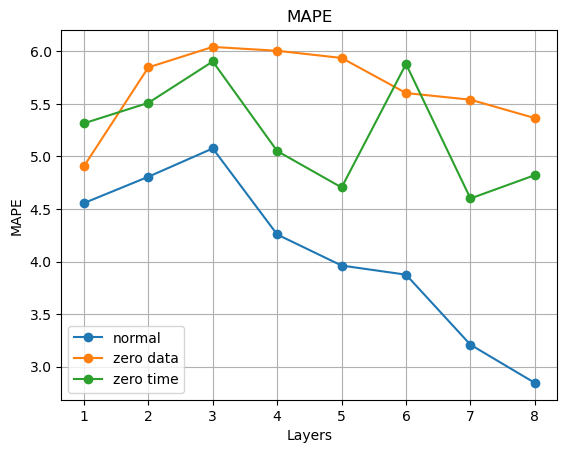

label:  normal
label:  zero data
label:  zero time


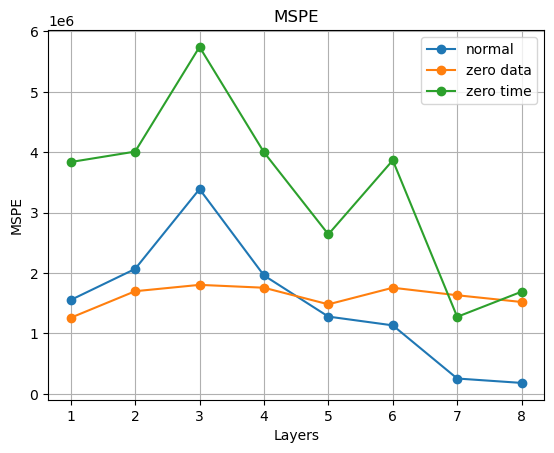

label:  normal
label:  zero data
label:  zero time


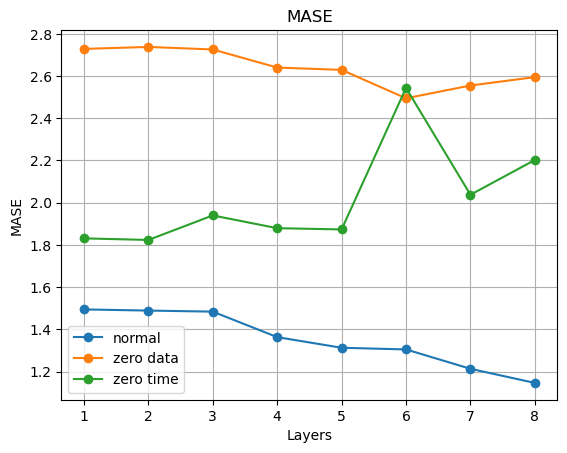

In [6]:
import matplotlib.pyplot as plt

# Plot each metric
for metric_name in metrics.keys():
    plt.figure()
    for desc, data in metrics_dict.items():
        print("label: ", desc)
        # print("data: ", data)
        plt.plot(
            [i + 1 for i in list(data[metric_name].keys())],
            list(data[metric_name].values()),
            marker="o",
            label=desc,
        )

    # plt.plot(
    #     [i + 1 for i in list(metrics_12hod[metric_name].keys())],
    #     list(metrics_3dow[metric_name].values()),
    #     marker="o",
    #     label="+3dow",
    # )
    # plt.plot(
    #     [i + 1 for i in list(metrics[metric_name].keys())],
    #     list(metrics_12hod[metric_name].values()),
    #     marker="o",
    #     label="3dow",
    # )
    plt.title(f"{metric_name.upper()}")
    plt.xlabel("Layers")
    plt.ylabel(metric_name.upper())
    plt.grid(True)
    plt.legend()
    plt.show()